### Task 4

#### Objective: Perform a geographical analysis of the restaurants in the dataset.

#### Steps:

1. Explore the latitude and longitude coordinates of the restaurants and visualize their distribution on a map.

2. Group the restaurants by city or locality and analyze the concentration of restaurants in different areas.

3. Calculate statistics such as the average ratings, cuisines, or price ranges by city or locality.

4. Identify any interesting insights or patterns related to the locations of the restaurants.


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv("Dataset.csv")

In [3]:
df.shape

(9551, 21)

In [4]:
geo_data = df[['Restaurant Name', 'City', 'Longitude', 'Latitude', 'Aggregate rating']]

In [5]:
# 1. Count of Restaurants per City
city_restaurant_count = geo_data['City'].value_counts()

In [6]:
city_restaurant_count

City
New Delhi           5473
Gurgaon             1118
Noida               1080
Faridabad            251
Ghaziabad             25
                    ... 
Panchkula              1
Mc Millan              1
Mayfield               1
Macedon                1
Vineland Station       1
Name: count, Length: 141, dtype: int64

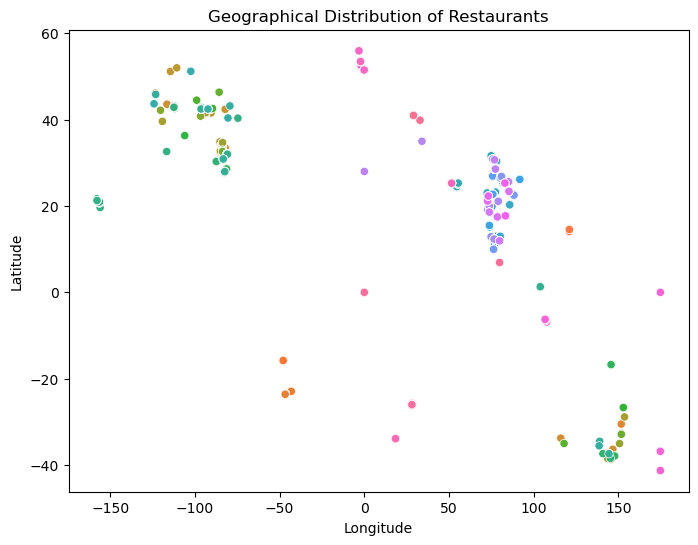

In [7]:
# 2. Geographical Distribution
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Longitude', y='Latitude', hue='City', data=geo_data, legend=False)
plt.title('Geographical Distribution of Restaurants')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

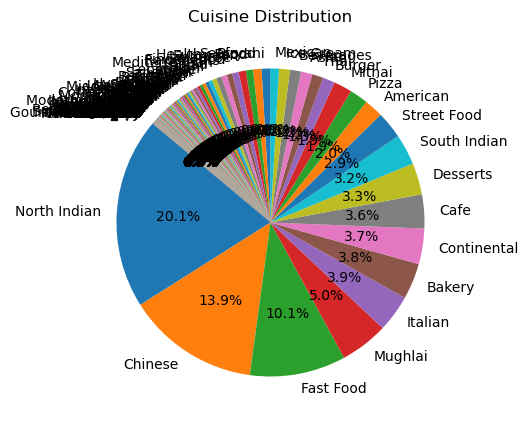

In [8]:
# 3. Pie Chart of Cuisine Distribution
plt.figure(figsize=(6, 5))
cuisine_counts = df['Cuisines'].str.split(', ', expand=True).stack().value_counts()
cuisine_counts.plot.pie(autopct='%1.1f%%', startangle=140)
plt.title('Cuisine Distribution')
plt.ylabel('')
plt.show()

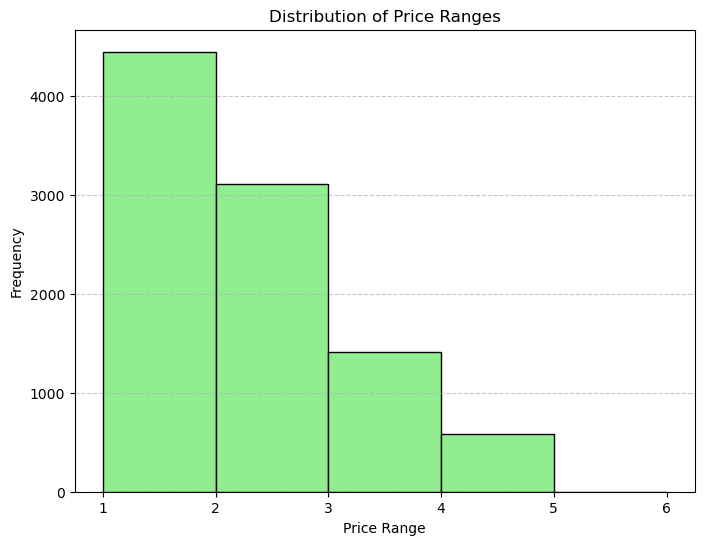

In [9]:
# 4. Histogram of Price Ranges
plt.figure(figsize=(8, 6))
plt.hist(df['Price range'], bins=range(1, 7), color='lightgreen', edgecolor='black')
plt.title('Distribution of Price Ranges')
plt.xlabel('Price Range')
plt.ylabel('Frequency')
plt.xticks(range(1, 7))
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

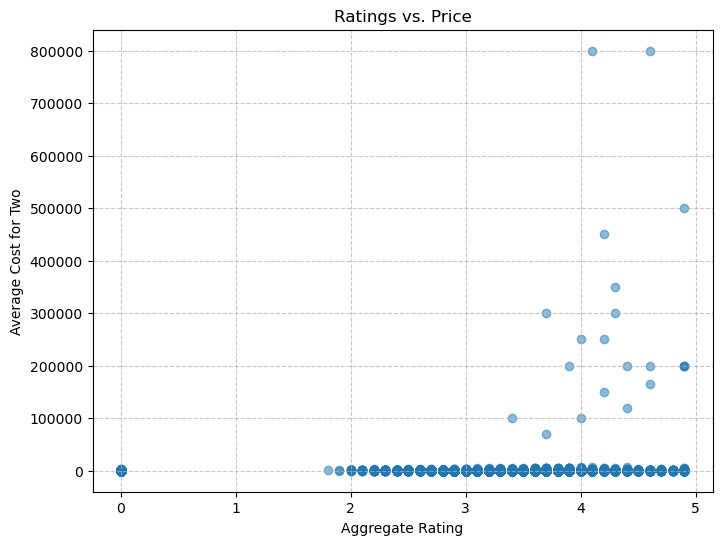

In [10]:
# 5. Scatter Plot of Ratings vs. Price
plt.figure(figsize=(8, 6))
plt.scatter(df['Aggregate rating'], df['Average Cost for two'], alpha=0.5)
plt.title('Ratings vs. Price')
plt.xlabel('Aggregate Rating')
plt.ylabel('Average Cost for Two')
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

In [11]:
# 6. Average Ratings per City
avg_ratings_per_city = geo_data.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False)

In [12]:
avg_ratings_per_city

City
Inner City          4.900000
Quezon City         4.800000
Makati City         4.650000
Pasig City          4.633333
Mandaluyong City    4.625000
                      ...   
New Delhi           2.438845
Montville           2.400000
Mc Millan           2.400000
Noida               2.036204
Faridabad           1.866932
Name: Aggregate rating, Length: 141, dtype: float64

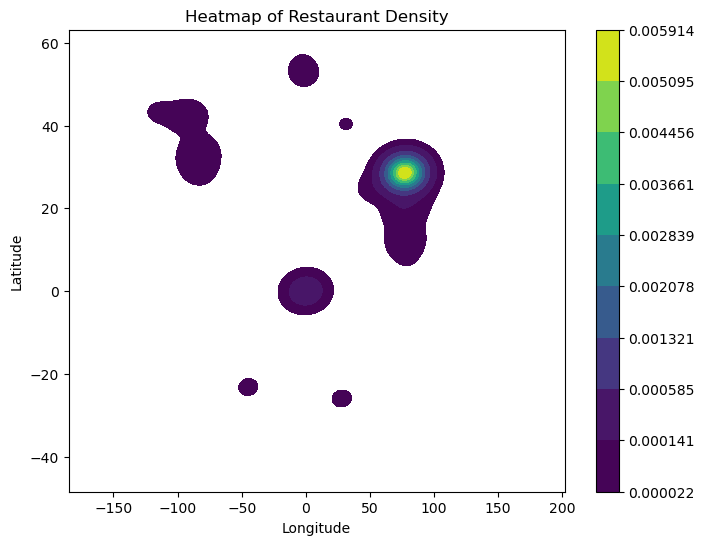

In [13]:
# 7. Heatmap of Restaurant Density
plt.figure(figsize=(8, 6))
sns.kdeplot(data=geo_data, x='Longitude', y='Latitude', shade=True, cmap='viridis', cbar=True)
plt.title('Heatmap of Restaurant Density')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

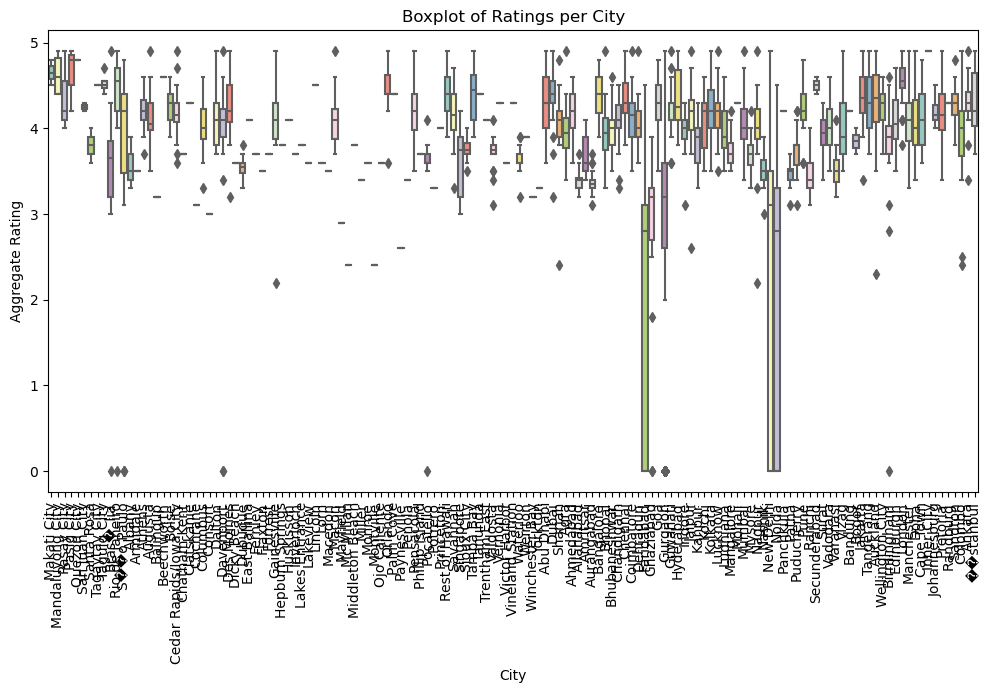

In [14]:
# 8. Boxplot of Ratings per City
plt.figure(figsize=(12, 6))
sns.boxplot(data=geo_data, x='City', y='Aggregate rating', palette='Set3')
plt.title('Boxplot of Ratings per City')
plt.xlabel('City')
plt.ylabel('Aggregate Rating')
plt.xticks(rotation=90)
plt.show()

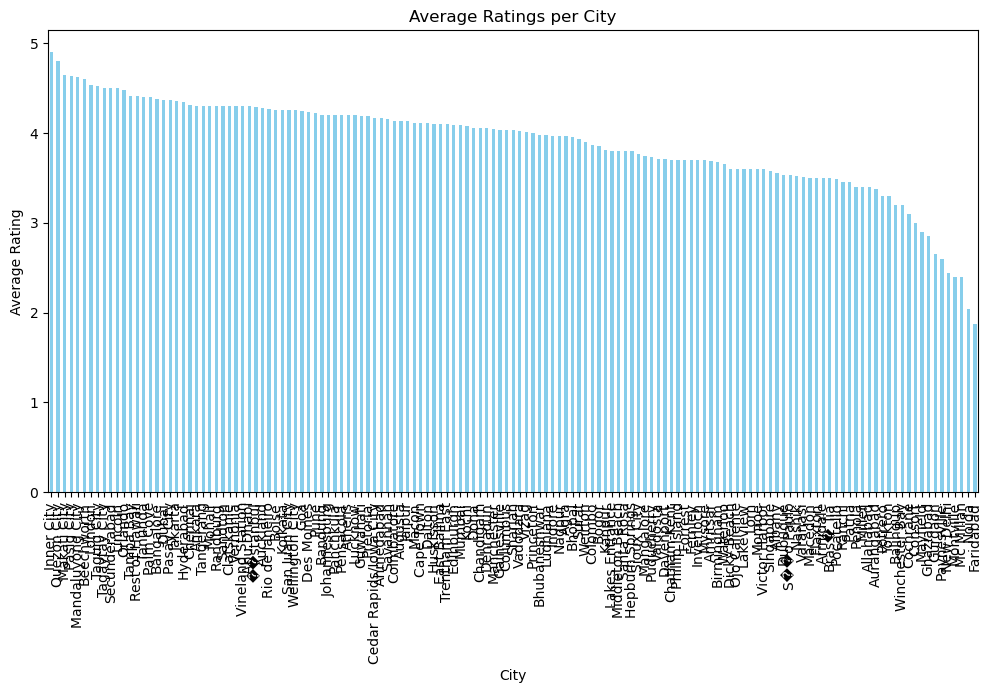

In [15]:
# 8. Bar Chart of Average Ratings per City
avg_ratings_per_city = geo_data.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False)
plt.figure(figsize=(12, 6))
avg_ratings_per_city.plot(kind='bar', color='skyblue')
plt.title('Average Ratings per City')
plt.xlabel('City')
plt.ylabel('Average Rating')
plt.xticks(rotation=90)
plt.show()

In [16]:
import folium
from folium.plugins import HeatMap

In [17]:
# Group the restaurants by city or locality
grouped_data = df.groupby('City')

In [18]:
# Calculate statistics such as average ratings, cuisines, or price ranges by city
city_stats = grouped_data.agg({
    'Aggregate rating': 'mean',  # Average rating
    'Cuisines': lambda x: ', '.join(str(cuisine) for cuisine in x),  # Concatenate cuisines
    'Average Cost for two': 'mean',  # Average cost for two
    'Longitude': 'mean',  # Average longitude
    'Latitude': 'mean'  # Average latitude
}).reset_index()

In [19]:
city_stats

,City,Aggregate rating,Cuisines,Average Cost for two,Longitude,Latitude
0,Abu Dhabi,4.300000,"American, American, Italian, Pizza, Turkish, A...",182.000000,54.405998,24.464269
1,Agra,3.965000,"North Indian, Mughlai, North Indian, Mughlai, ...",1065.000000,54.622830,19.016683
2,Ahmedabad,4.161905,"Chinese, Italian, North Indian, Mexican, Medit...",857.142857,72.531324,23.036910
3,Albany,3.555000,"BBQ, Burger, Seafood, American, BBQ, nan, Mexi...",19.750000,-84.186592,31.602963
4,Allahabad,3.395000,"North Indian, South Indian, Fast Food, Cafe, F...",517.500000,61.378793,19.089371
...,...,...,...,...,...,...
136,Weirton,3.900000,"Burger, Greek, Sandwich",25.000000,-80.529488,40.396043
137,Wellington City,4.250000,"Cafe, Kiwi, American, Fast Food, Italian, Cafe...",71.250000,174.778100,-41.293814
138,Winchester Bay,3.200000,"Burger, Seafood, Steak",25.000000,-124.175346,43.678998
139,Yorkton,3.300000,Asian,25.000000,-102.461317,51.210682


In [20]:
# Visualize the distribution of restaurants on a map
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]  # Center of the map

In [21]:
map_center

[25.854380700074756, 64.12657446168706]

In [22]:
# Create a folium map object
mymap = folium.Map(location=map_center, zoom_start=10)

In [23]:
# Add markers for each restaurant
for index, row in df.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']], popup=row['Restaurant Name']).add_to(mymap)

In [24]:
# Create a heatmap layer to visualize restaurant density
heat_data = [[row['Latitude'], row['Longitude']] for index, row in df.iterrows()]
HeatMap(heat_data).add_to(mymap)

In [25]:
mymap.save("restaurant_distribution_map.html")

In [26]:
mymap

In [27]:
#visualize average ratings on a map
rating_map = folium.Map(location=map_center, zoom_start=10)
HeatMap(data=df[['Latitude', 'Longitude', 'Aggregate rating']], radius=10).add_to(rating_map)
rating_map.save("rating_heatmap.html")

In [28]:
rating_map

### Conclusion : 
Performed a geographical analysis of the restaurants based on Average Ratings, Cuisine Ratings and Cuisines Diversity by City/Locality.